This notebook processes ROI formatted as TXT/CSV files. Example shown below uses a TXT file.

In [1]:
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import pickle as pkl
import skimage
import yaml
from typing import Union, Optional, Type, Tuple, List, Dict
import sys

# Project Root
# ROOT_DIR = os.path.dirname(os.path.abspath(__file__)) 
ROOT_DIR = os.path.join(os.path.dirname(sys.path[0]), 'image_cytof')
sys.path.append(ROOT_DIR)

from cytof.hyperion_preprocess import cytof_read_data_roi
from cytof.utils import save_multi_channel_img, check_feature_distribution

/project/DPDS/Xiao_lab/shared/deep_learning_SW_RR/envs/cytof-notebook/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


##  Set Parameters
- `filename` (str): full file path for input image
- `outdir` (str): output saving directory
- `slide` (str): name (identifier) for the slide
- `roi` (str): name (identifier) for the roi
- `quality_control_thres` (str): threshold for deciding whether or not keep this image  
- `channel_dict` (dict): keys are "nuclei" (required) and "membrane" (optional)
- `channels_remove` (list): a list of channel names to be discarded
- `use_membrane` (bool): whether or not use membrane channel as a guide in cell segmentation
- `cell_radius` (int): assumed cell radius
- `normalize_qs`: q values for percentile normalization

In [2]:
%matplotlib inline

In [3]:
class SetParameters():
    def __init__(self, 
                 filename: str, 
                 outdir: str, 
                 label_marker_file: Optional[str] = None, 
                 slide: Optional[str] = 'slide1', 
                 roi: Optional[str] = 'roi1', 
                 quality_control_thres: Optional[int] = 50,
                 channels_remove: Optional[List] = None, 
                 channels_dict: Optional[Dict] = None,
                 keep_originals: Optional[bool] = True,
                 use_membrane: Optional[bool] = True,
                 cell_radius: Optional[int] = 5, 
                 normalize_qs: Optional[List[int]] = [75, 99]):
        
        self.filename = filename
        self.outdir   = outdir
        self.slide    = slide
        self.roi      = roi
        self.quality_control_thres = quality_control_thres
        self.label_marker_file     = label_marker_file
        self.channels_remove = channels_remove if channels_remove is not None else []
        self.channels_dict   = channels_dict if channels_dict is not None else {}
        self.keep_originals  = keep_originals
        self.use_membrane    = use_membrane
        self.cell_radius     = cell_radius
        self.normalize_qs    = normalize_qs

In [4]:
params = SetParameters(
    # TODO: change filename and other options here
    filename = "/archive/DPDS/Xiao_lab/shared/hudanyun_sheng/github/image_cytof_test_data/hyperion/cohort1/NP37646_B5/TM14MAR20_NP37646_B5_ROI_001B_9.txt",    
    outdir  ="../test_out/single_roi", 
    slide   = "NP37646_B5",
    roi     = "ROI_001B_9",
    label_marker_file = "/archive/DPDS/Xiao_lab/shared/hudanyun_sheng/github/image_cytof_test_data/external_data/The Single-Cell Pathology Landscape of Breast Cancer/markers_labels.txt",
    channels_dict = {
        'nuclei': ['191Ir(Ir191Di)', '193Ir(Ir193Di)', 'Histone3(Yb176Di)'],
        'membrane': []
    }
    
## optional parameters to define
#     quality_control_thres=50,
#     channels_remove=[],
#     use_membrane=True,
#     cell_radius=5, 
#     normalize_qs=[75, 99]
# keep_originals = True
)

## Section 1. Read and preprocess data
1. `cytof_read_data_roi`
2. `cytof_img.quality_control()`
3. `cytof_img.get_markers()`
4. `cytof_img.preprocess()`
5. `cytof_img.check_channels()`
6. `cytof_img.get_image()`
7. `cytof_img.save_channel_images()`
8. `cytof_img.remove_special_channels()`

#### 1. read data: from a .txt file to a dataframe and save as attribute `df` of `cytof_img`.

In [5]:
cytof_img, cols = cytof_read_data_roi(params.filename, params.slide, params.roi)
print("file: {}\nslide: {}, roi: {}".format(cytof_img.filename, cytof_img.slide, cytof_img.roi))

file: /archive/DPDS/Xiao_lab/shared/hudanyun_sheng/github/image_cytof_test_data/hyperion/cohort1/NP37646_B5/TM14MAR20_NP37646_B5_ROI_001B_9.txt
slide: NP37646_B5, roi: ROI_001B_9


#### 2. quality control (set the `keep` attribute of `cytof_img`) and make saving directory for this ROI

In [6]:
cytof_img.quality_control(thres=params.quality_control_thres)
if cytof_img.keep:

    outdir = os.path.join(params.outdir, params.slide, params.roi)
    print("Saving to {}".format(outdir))
    if not os.path.exists(outdir):
        os.makedirs(outdir)
        
    dir_channelimg = os.path.join(outdir, "channel_images")
    if not os.path.exists(dir_channelimg):
        os.makedirs(dir_channelimg)
        
    dir_feature = os.path.join(outdir, "feature")
    if not os.path.exists(dir_feature):
        os.makedirs(dir_feature)
        
    # Create a "readme.txt" file and write information of original markers and channels into it    
    f_info = open(os.path.join(outdir, 'readme.txt'), 'w')

#### 3. Get the list of channel names, protein markers correspond to each image channel
Also write the information to the .txt file created previously  
TODO: user input channels / markers

In [7]:
cytof_img.get_markers()
print("Markers: \n{}".format(cytof_img.markers))
print("\nChannels: \n{}".format(cytof_img.channels))
print(len(cytof_img.raw_markers), len(cytof_img.raw_channels))

# f_info.write("Original markers: ")
# f_info.write('\n{}'.format(", ".join(cytof_img.markers)))
# f_info.write("\nOriginal channels: ")
# f_info.write('\n{}'.format(", ".join(cytof_img.channels)))

Markers: 
['116Cd', '140Ce', 'CD38', 'CD19', 'Vimentin', '144Nd', '145Nd', '146Nd', 'CD163', 'AE1-AE3', 'CD16', 'PD-L1', 'CD123', 'IFNg', '153Eu', 'CD11c', 'FoxP3', 'CD4', '157Gd', '158Gd', 'CD68', '160Dy', 'CD20', 'CD8', '163Dy', '164Er', 'PD-1', '166Er', 'GranzymeB', 'Ki-67', '169Tm', '170Yb', '171Yb', '172Yb', '173Yb', 'HLA-DR', '175Lu', 'Histone3', '191Ir', '193Ir', 'Cisplatin']

Channels: 
['116Cd(Cd116Di)', '140Ce(Ce140Di)', 'CD38(Pr141Di)', 'CD19(Nd142Di)', 'Vimentin(Nd143Di)', '144Nd(Nd144Di)', '145Nd(Nd145Di)', '146Nd(Nd146Di)', 'CD163(Sm147Di)', 'AE1-AE3(Nd148Di)', 'CD16(Sm149Di)', 'PD-L1(Nd150Di)', 'CD123(Eu151Di)', 'IFNg(Sm152Di)', '153Eu(Eu153Di)', 'CD11c(Sm154Di)', 'FoxP3(Gd155Di)', 'CD4(Gd156Di)', '157Gd(Gd157Di)', '158Gd(Gd158Di)', 'CD68(Tb159Di)', '160Dy(Dy160Di)', 'CD20(Dy161Di)', 'CD8(Dy162Di)', '163Dy(Dy163Di)', '164Er(Er164Di)', 'PD-1(Ho165Di)', '166Er(Er166Di)', 'GranzymeB(Er167Di)', 'Ki-67(Er168Di)', '169Tm(Tm169Di)', '170Yb(Yb170Di)', '171Yb(Yb171Di)', '172Yb(Yb

#### 4. preprocess: handle missing values (fill missing values with 0.)

In [8]:
cytof_img.preprocess()

#### 5. (optional) check channels: get a glance of each channel image

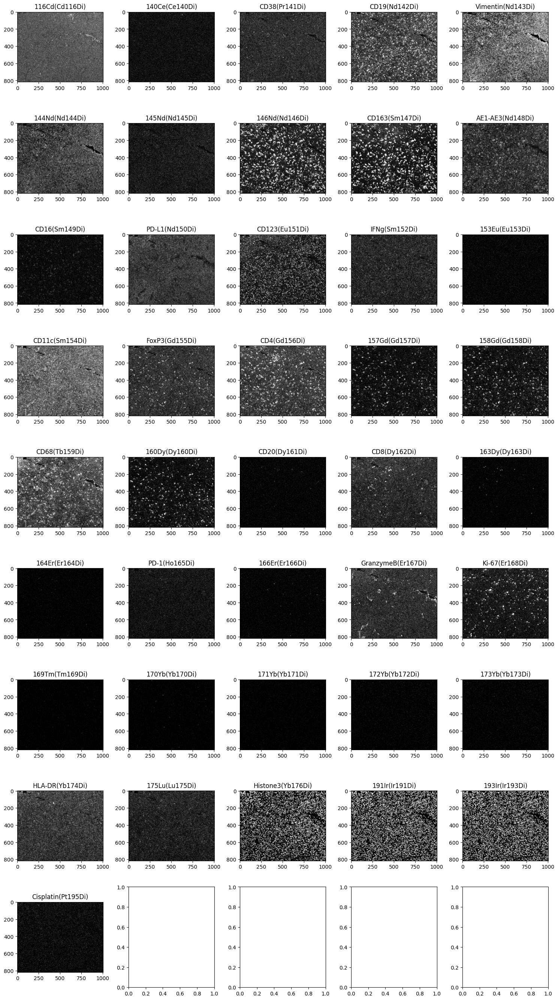

In [9]:
cytof_img.check_channels()

#### 6. Get multi channel images

In [10]:
cytof_img.get_image()

#### 7. (optional) save channel images

In [11]:
# cytof_img.save_channel_images(dir_channelimg)

#### 8. (optional) remove unwanted channels (change in "cids")
Use prior knowledge or take a close look at the channel images printed out to decide which channel(s) to discard;  
alternatively, take a look at the saved channel images if saved.  
Set `channels_remove` to params, which will be used in batch_process later.

In [12]:
channels_remove = ['140Ce(Ce140Di)', '153Eu(Eu153Di)','CD20(Dy161Di)','163Dy(Dy163Di)',
                   '164Er(Er164Di)','166Er(Er166Di)','169Tm(Tm169Di)',
                   '170Yb(Yb170Di)', '171Yb(Yb171Di)', '172Yb(Yb172Di)', '173Yb(Yb173Di)']

setattr(params, "channels_remove", channels_remove)

Original list of channels: 
116Cd(Cd116Di), 140Ce(Ce140Di), CD38(Pr141Di), CD19(Nd142Di), Vimentin(Nd143Di), 144Nd(Nd144Di), 145Nd(Nd145Di), 146Nd(Nd146Di), CD163(Sm147Di), AE1-AE3(Nd148Di), CD16(Sm149Di), PD-L1(Nd150Di), CD123(Eu151Di), IFNg(Sm152Di), 153Eu(Eu153Di), CD11c(Sm154Di), FoxP3(Gd155Di), CD4(Gd156Di), 157Gd(Gd157Di), 158Gd(Gd158Di), CD68(Tb159Di), 160Dy(Dy160Di), CD20(Dy161Di), CD8(Dy162Di), 163Dy(Dy163Di), 164Er(Er164Di), PD-1(Ho165Di), 166Er(Er166Di), GranzymeB(Er167Di), Ki-67(Er168Di), 169Tm(Tm169Di), 170Yb(Yb170Di), 171Yb(Yb171Di), 172Yb(Yb172Di), 173Yb(Yb173Di), HLA-DR(Yb174Di), 175Lu(Lu175Di), Histone3(Yb176Di), 191Ir(Ir191Di), 193Ir(Ir193Di), Cisplatin(Pt195Di)

Updated list of channels: 
116Cd(Cd116Di), CD38(Pr141Di), CD19(Nd142Di), Vimentin(Nd143Di), 144Nd(Nd144Di), 145Nd(Nd145Di), 146Nd(Nd146Di), CD163(Sm147Di), AE1-AE3(Nd148Di), CD16(Sm149Di), PD-L1(Nd150Di), CD123(Eu151Di), IFNg(Sm152Di), CD11c(Sm154Di), FoxP3(Gd155Di), CD4(Gd156Di), 157Gd(Gd157Di), 158Gd(Gd158D

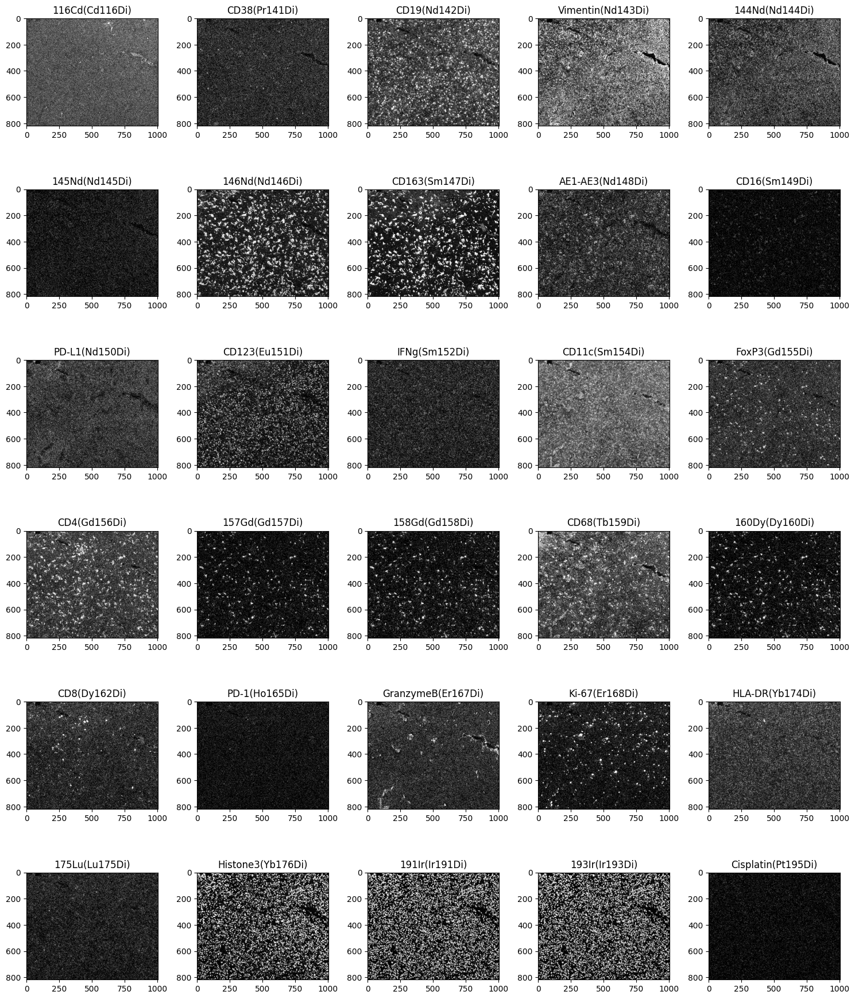

In [13]:
if hasattr(params,"channels_remove") and len(params.channels_remove) > 0:
    cytof_img.remove_special_channels(params.channels_remove)
    # Get multi channel images (again)
    cytof_img.get_image()
    
    # (optional) save channel images
    # cytof_img.save_channel_images(dir_channelimg)
    
    print("Original list of channels: \n{}".format(', '.join(cytof_img.raw_channels)))
    print("\nUpdated list of channels: \n{}".format(', '.join(cytof_img.channels)))
    
    # (optional) check channels after removing unwanted channels: get a glance of each channel image
    cytof_img.check_channels()

### Visualize as pseudocolored images
Multiple options available

In [14]:
vis_channel_names = ['Vimentin(Nd143Di)','191Ir(Ir191Di)','CD163(Sm147Di)','CD8(Dy162Di)',
                     'CD4(Gd156Di)','Ki-67(Er168Di)','AE1-AE3(Nd148Di)']
vis_channel_ids   = [3, 27, 7]

vis_range = {
    'h0': 500,
    'h1': 800,
    'w0': 0,
    'w1': 300
}

##### (option 1) visualize selected channels in pseudoRGB and save, using channel names

/project/DPDS/Xiao_lab/shared/deep_learning_SW_RR/cytof/multiTAP_clean/multiTAP/image_cytof/cytof/classes.py:271: UserWarning: Visualizing more than 3 channels the same time results in deteriorated visualization.                 It is not recommended!
  warnings.warn(


Visualizing channels: Vimentin(Nd143Di), 191Ir(Ir191Di), CD163(Sm147Di), CD8(Dy162Di), CD4(Gd156Di), Ki-67(Er168Di), AE1-AE3(Nd148Di)
Visualizing... 
Vimentin(Nd143Di) in red
191Ir(Ir191Di) in green
CD163(Sm147Di) in blue
CD8(Dy162Di) in cyan
CD4(Gd156Di) in magenta
Ki-67(Er168Di) in yellow
AE1-AE3(Nd148Di) in white



(-0.5, 299.5, 299.5, -0.5)

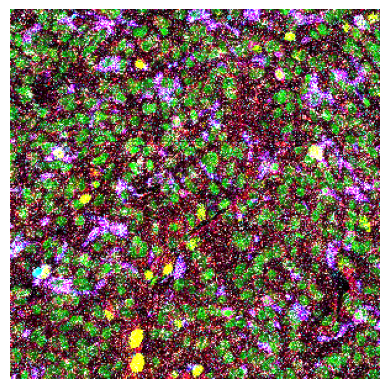

In [15]:
pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_names=vis_channel_names, 
                                                                              visualize=False)
fig, ax = plt.subplots(1,1)
ax.imshow(pseudoRGB[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :])
plt.axis('off')

# save visualization
# _channel_ids = [cytof_img.channels.index(_) for _ in vis_channel_names]
# save_multi_channel_img(
#     skimage.img_as_ubyte(
#         pseudoRGB[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
#     os.path.join(dir_channelimg, 
#                  "fig3_channels_{}.png".format('_'.join([cytof_img.markers[x] for x in _channel_ids]))
#                 ))

##### (option 2) visualize selected channels in pseudoRGB and save using channel indices

Visualizing channels: Vimentin(Nd143Di), 191Ir(Ir191Di), CD163(Sm147Di)
Visualizing... 
Vimentin(Nd143Di) in red
191Ir(Ir191Di) in green
CD163(Sm147Di) in blue



(-0.5, 299.5, 299.5, -0.5)

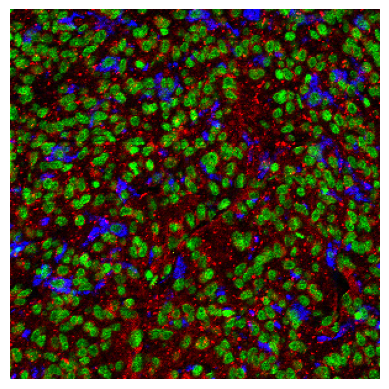

In [16]:
pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_ids=vis_channel_ids, 
                                                                              visualize=False)
fig, ax = plt.subplots(1,1)
ax.imshow(pseudoRGB[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :])
plt.axis('off')

# save_multi_channel_img(
#     skimage.img_as_ubyte(
#         pseudoRGB[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
#     os.path.join(dir_channelimg, 
#                  "fig3_channels_{}.png".format('_'.join([cytof_img.markers[x] for x in vis_channel_ids]))
#                 ))

##### (option 3) visualize selected one channel in specified color (choose from "red", "green", and "blue")

(-0.5, 299.5, 299.5, -0.5)

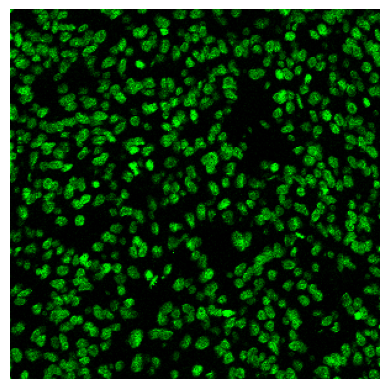

In [17]:
channel_name = '191Ir(Ir191Di)'
color = "green"

vis_im = cytof_img.visualize_single_channel(channel_name=channel_name, color=color)
fig, ax = plt.subplots(1,1)
ax.imshow(vis_im[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :])
plt.axis('off')

# _channel_ids = [cytof_img.channels.index(_) for _ in vis_channel_names]
# save_multi_channel_img(
#     skimage.img_as_ubyte(vis_im[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
#     os.path.join(dir_channelimg, "channel_{}_in_{}.png".format(channel_name, color)))

### Define special channel(s)
Define nuclei channel, optionally, define membrane channel, to get prepared for nuclei and cells segmentation.  

In [18]:
params.channels_dict

{'nuclei': ['191Ir(Ir191Di)', '193Ir(Ir193Di)', 'Histone3(Yb176Di)'],
 'membrane': []}

In [19]:
channels_ = cytof_img.channels[:]
print("\nList of channels before defining special channel(s): \n{}".format(', '.join(channels_)))
# define special channels (if desired)
channels_rm = cytof_img.define_special_channels(params.channels_dict)


# remove unwanted channels (if desired)
if not params.keep_originals: # if not keeping original channels
    cytof_img.remove_special_channels(channels_rm)
print("\nUpdated list of channels after defining special channel(s): \n{}".format(', '.join(cytof_img.channels)))


List of channels before defining special channel(s): 
116Cd(Cd116Di), CD38(Pr141Di), CD19(Nd142Di), Vimentin(Nd143Di), 144Nd(Nd144Di), 145Nd(Nd145Di), 146Nd(Nd146Di), CD163(Sm147Di), AE1-AE3(Nd148Di), CD16(Sm149Di), PD-L1(Nd150Di), CD123(Eu151Di), IFNg(Sm152Di), CD11c(Sm154Di), FoxP3(Gd155Di), CD4(Gd156Di), 157Gd(Gd157Di), 158Gd(Gd158Di), CD68(Tb159Di), 160Dy(Dy160Di), CD8(Dy162Di), PD-1(Ho165Di), GranzymeB(Er167Di), Ki-67(Er168Di), HLA-DR(Yb174Di), 175Lu(Lu175Di), Histone3(Yb176Di), 191Ir(Ir191Di), 193Ir(Ir193Di), Cisplatin(Pt195Di)

Updated list of channels after defining special channel(s): 
116Cd(Cd116Di), CD38(Pr141Di), CD19(Nd142Di), Vimentin(Nd143Di), 144Nd(Nd144Di), 145Nd(Nd145Di), 146Nd(Nd146Di), CD163(Sm147Di), AE1-AE3(Nd148Di), CD16(Sm149Di), PD-L1(Nd150Di), CD123(Eu151Di), IFNg(Sm152Di), CD11c(Sm154Di), FoxP3(Gd155Di), CD4(Gd156Di), 157Gd(Gd157Di), 158Gd(Gd158Di), CD68(Tb159Di), 160Dy(Dy160Di), CD8(Dy162Di), PD-1(Ho165Di), GranzymeB(Er167Di), Ki-67(Er168Di), HLA-DR(Yb174Di

### Visualizations after defining special channels

In [20]:
vis_range = {
    'h0': 500,
    'h1': 800,
    'w0': 0,
    'w1': 300
}

##### (option 1) check channels: get a glance of each added channel image

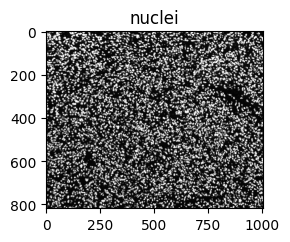

In [21]:
vis_channels = [k for (k, itm) in params.channels_dict.items() if len(itm)>0] #['nuclei', 'membrane']
cytof_img.check_channels(channels=vis_channels)

##### (option 2) visualize in pseudo-colored image (with specified color)

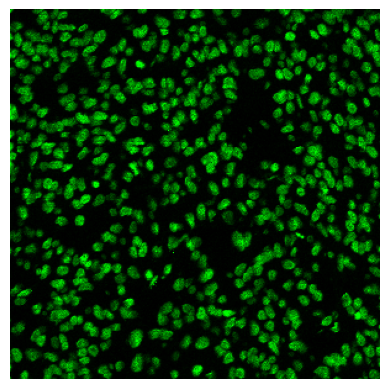

In [22]:
color = "green"
for channel_name in vis_channels:
    vis_im = cytof_img.visualize_single_channel(channel_name=channel_name, color=color)
    fig, ax = plt.subplots(1,1)
    ax.imshow(vis_im[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'],:])
    plt.axis('off')

    # _channel_ids = [cytof_img.channels.index(_) for _ in vis_channel_names]
    # save_multi_channel_img(
    #     skimage.img_as_ubyte(vis_im[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
    #     os.path.join(dir_channelimg, "channel_{}_in_{}.png".format(channel_name, color)))

##### (optional) save newly added channel images

In [23]:
# cytof_img.save_channel_images(dir_channelimg, channels=vis_channels)

Append the updated information to the .txt file created previously.

In [24]:
# f_info.write("\nChannels removed: ")
# f_info.write("\n{}".format(", ".join(params.channels_remove+channels_rm)))
# f_info.write("\nFinal markers: ")
# f_info.write("\n{}".format(', '.join(cytof_img.markers)))
# f_info.write("\nFinal channels: ")
# f_info.write("\n{}".format(', '.join(cytof_img.channels)))
# f_info.close()

## Section 2. Nuclei and cells segmentation
With the nuclei channel (and membrane channel) defined, nuclei and cells segmentation can be easily done with the class method `get_seg`.  
`cytof_img.get_seg()`

#### Get nuclei and cell segmentation

Nuclei segmentation...


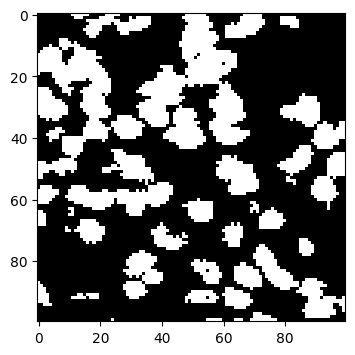

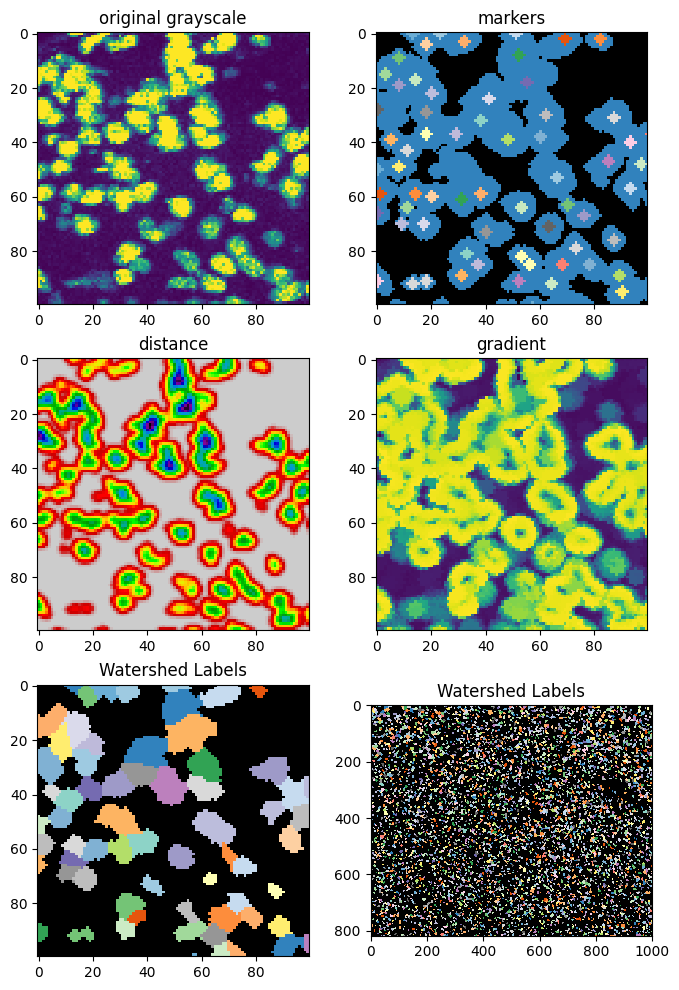

Cell segmentation...


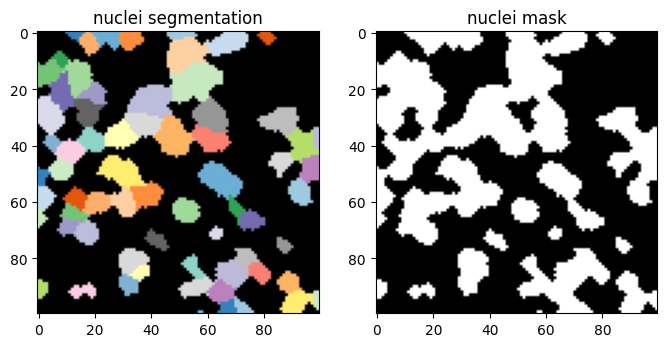

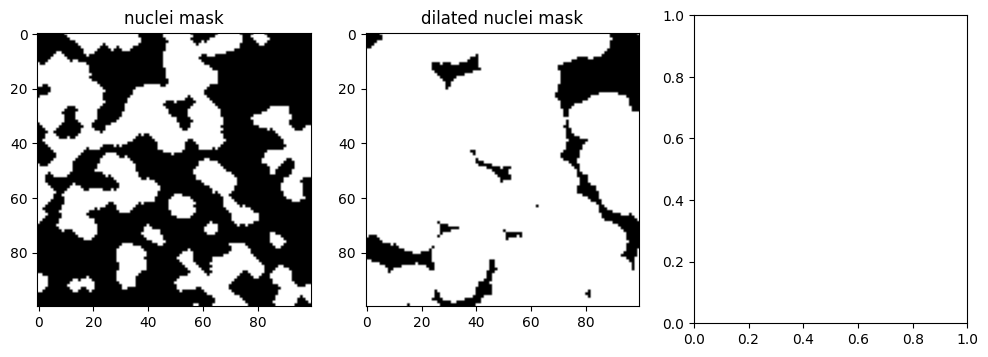

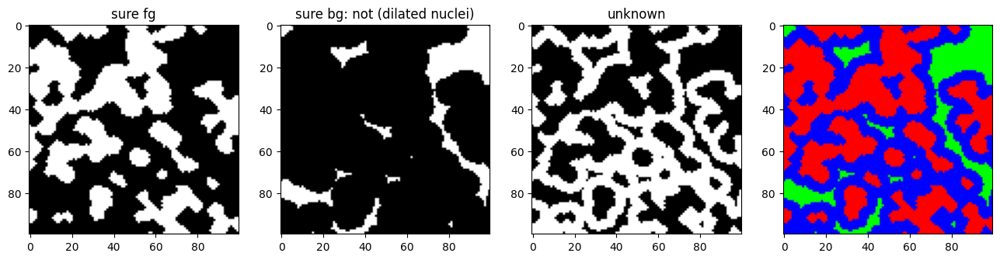

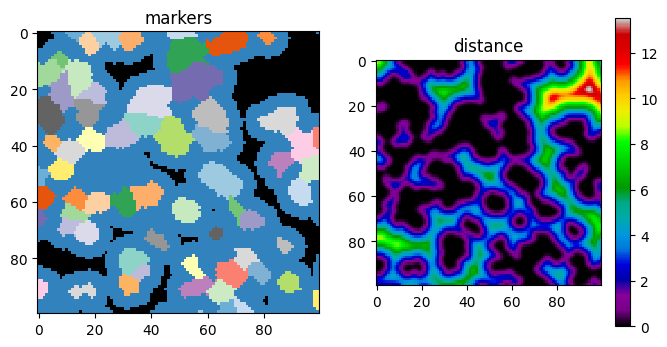

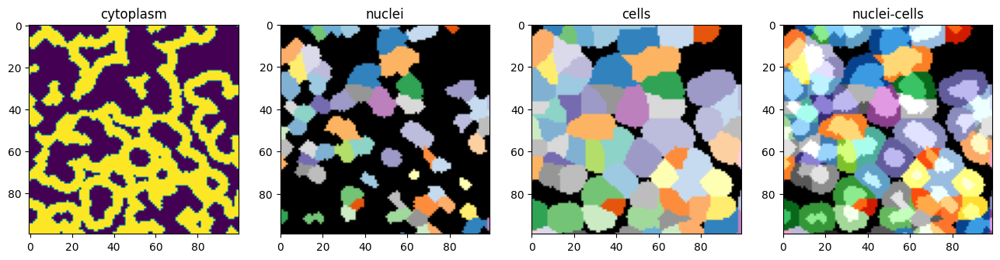

In [25]:
nuclei_seg, cell_seg = cytof_img.get_seg(use_membrane=params.use_membrane, 
                                         radius=params.cell_radius, # 10
                                         show_process=True)

### Visualizations of nuclei and cells segmentation

#### (option 1) Visualization nuclei and/or cell segmentation output in pseudo RGB image with boundaries marked

Visualizing... 
nuclei in red
116Cd(Cd116Di) in green

nuclei boundary marked by yellow


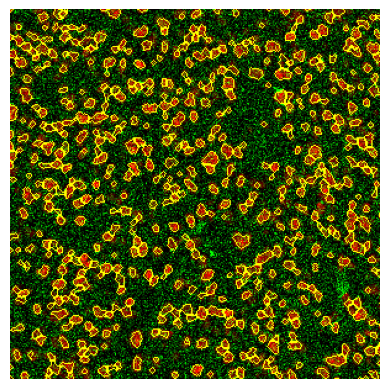

In [26]:
vis_range = {
    'h0': 500,
    'h1': 800,
    'w0': 0,
    'w1': 300
}

marked_image_nuclei = cytof_img.visualize_seg(segtype="nuclei", show=False)
plt.imshow(marked_image_nuclei[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'],:])
plt.axis('off')
plt.show()

# # (optional) save segmentation visualization
# _save_multi_channel_img(skimage.img_as_ubyte(marked_image_nuclei), os.path.join(savedir, "nuclei_seg.png"))
# save_multi_channel_img(
#     skimage.img_as_ubyte(marked_image_nuclei[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'],:]), 
#     os.path.join(outdir, "nuclei_seg_subset.png"))

Visualizing... 
nuclei in red
116Cd(Cd116Di) in green

cell boundary marked by white


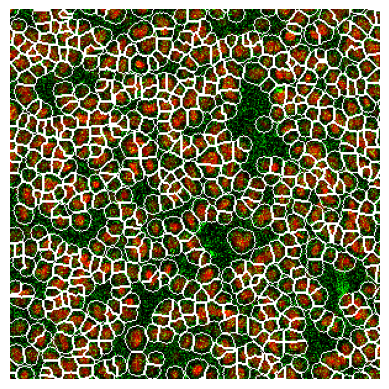

In [27]:
# visualize cell segmentation with boundaries marked
# note: showing a selected region

marked_image_cell = cytof_img.visualize_seg(segtype="cell", show=False)
plt.imshow(marked_image_cell[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'],:])
plt.axis('off')
plt.show()

# # (optional) save segmentation visualization
# _save_multi_channel_img(skimage.img_as_ubyte(marked_image_cell), os.path.join(savedir, "cell_seg.png"))
# save_multi_channel_img(
#     skimage.img_as_ubyte(marked_image_cell[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
#     os.path.join(outdir, "cell_seg_subset.png"))

#### (option 2) Visualization nuclei and/or cell segmentation output in single-colored RGB image (color specified) with boundaries marked

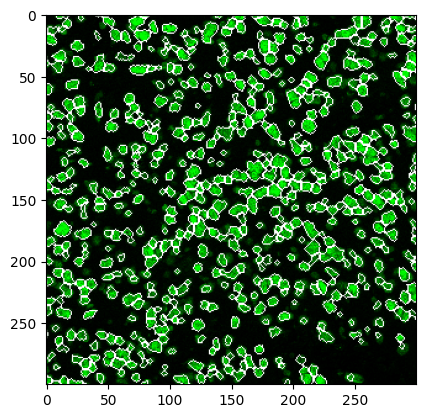

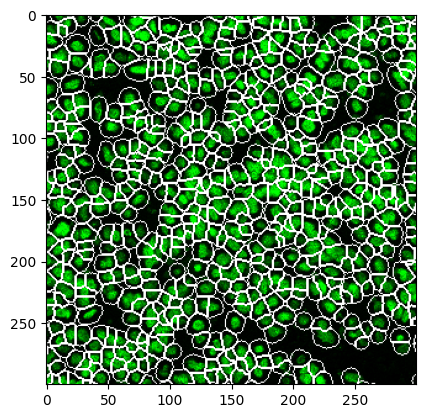

In [28]:
## Note: temp only for making this plot
## visualize with single channel and boundary

from skimage.segmentation import mark_boundaries
# from utils import save_multi_channel_img
# import skimage

vis_im = cytof_img.visualize_single_channel(channel_name="nuclei", 
                             color="green", quantile=None, 
                             visualize=False)

marked_image_nuclei_ = mark_boundaries(vis_im,
                               cytof_img.nuclei_seg, mode='inner', color=(1, 1, 1), background_label=1)
marked_image_cell_ = mark_boundaries(vis_im,
                               cytof_img.cell_seg, mode='inner', color=(1, 1, 1), background_label=1)
# plt.figure(figsize=(8,8))
plt.imshow(marked_image_nuclei_[0:300, 600:900,:])
plt.show()
# plt.figure(figsize=(8,8))
plt.imshow(marked_image_cell_[0:300, 600:900,:])
plt.show()

# save_multi_channel_img(skimage.img_as_ubyte(marked_image_nuclei_[0:300, 600:900,:]), 
#                         os.path.join(outdir, "nuclei_seg_subset_.png"))

# save_multi_channel_img(skimage.img_as_ubyte(marked_image_cell_[0:300, 600:900,:]), 
#                         os.path.join(outdir, "cell_seg_subset_.png"))

#### Save the `CytofImage` class instance as a pickle file.

In [29]:
# savename_cytof_img = os.path.join(outdir, "cytof_img.pkl")
# cytof_img.save_cytof(savename_cytof_img)

## Section 3. Feature extraction
With nuclei and cells segmented, single-nucleus and single-cell features can be extracted with class method `extract_feature`.  
`extract_feature`, `check_feature_distribution`

In [30]:
cytof_img.extract_features(params.filename)

cytof_img.df_feature.sample(5)

,filename,id,coordinate_x,coordinate_y,area_nuclei,area_cell,convex_area_nuclei,convex_area_cell,eccentricity_nuclei,eccentricity_cell,...,191Ir(Ir191Di)_cell_sum,191Ir(Ir191Di)_cell_ave,193Ir(Ir193Di)_nuclei_sum,193Ir(Ir193Di)_nuclei_ave,193Ir(Ir193Di)_cell_sum,193Ir(Ir193Di)_cell_ave,Cisplatin(Pt195Di)_nuclei_sum,Cisplatin(Pt195Di)_nuclei_ave,Cisplatin(Pt195Di)_cell_sum,Cisplatin(Pt195Di)_cell_ave
3802,/archive/DPDS/Xiao_lab/shared/hudanyun_sheng/g...,3804,162.521739,621.191304,115,251,127,269,0.604242,0.683902,...,6824.300,27.188446,10483.226,91.158487,11960.512,47.651442,7.015,0.061000,16.543,0.065908
4093,/archive/DPDS/Xiao_lab/shared/hudanyun_sheng/g...,4095,505.309091,667.800000,55,126,60,136,0.822945,0.918404,...,3486.745,27.672579,5352.315,97.314818,6178.397,49.034897,8.855,0.161000,18.579,0.147452
3294,/archive/DPDS/Xiao_lab/shared/hudanyun_sheng/g...,3296,767.890909,538.036364,55,140,66,150,0.642801,0.429048,...,1481.408,10.581486,1822.273,33.132236,2479.174,17.708386,8.219,0.149436,12.368,0.088343
1304,/archive/DPDS/Xiao_lab/shared/hudanyun_sheng/g...,1306,345.547170,211.132075,53,122,66,147,0.712976,0.283841,...,2784.710,22.825492,3127.590,59.011132,4923.408,40.355803,4.015,0.075755,7.479,0.061303
4197,/archive/DPDS/Xiao_lab/shared/hudanyun_sheng/g...,4199,668.600000,685.618182,55,146,64,183,0.625568,0.720411,...,2934.903,20.102075,4395.083,79.910600,5316.749,36.416089,6.654,0.120982,6.654,0.045575


##### (optional) save extracted feature

In [31]:
# cytof_img.df_feature.to_csv(os.path.join(dir_feature, "feature_summary.csv"), index=False)

#### Check feature distribution

In [32]:
# print the keys of extracted features (feature subsets)
print(cytof_img.features.keys())

dict_keys(['nuclei_morphology', 'cell_morphology', 'cell_sum', 'cell_ave', 'nuclei_sum', 'nuclei_ave'])


116Cd(Cd116Di)_cell_sum


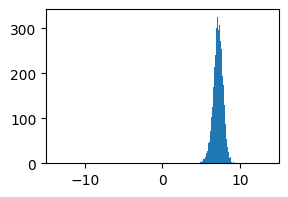

CD38(Pr141Di)_cell_sum


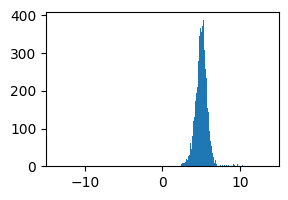

CD19(Nd142Di)_cell_sum


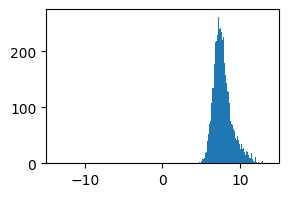

Vimentin(Nd143Di)_cell_sum


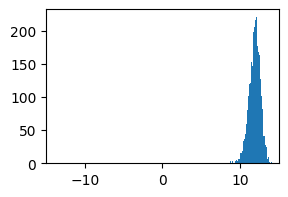

144Nd(Nd144Di)_cell_sum


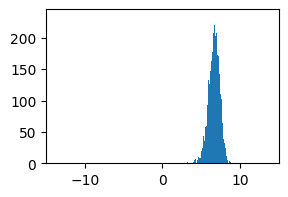

145Nd(Nd145Di)_cell_sum


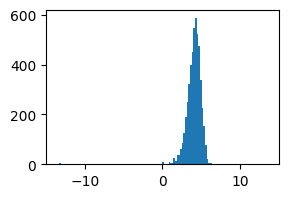

146Nd(Nd146Di)_cell_sum


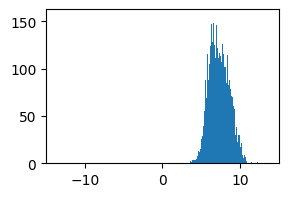

CD163(Sm147Di)_cell_sum


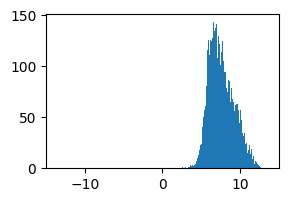

AE1-AE3(Nd148Di)_cell_sum


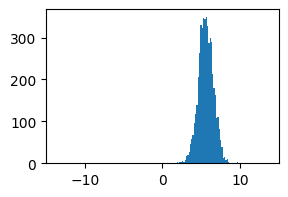

CD16(Sm149Di)_cell_sum


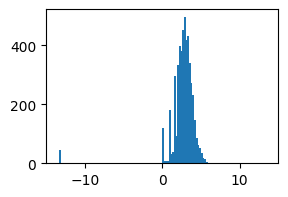

PD-L1(Nd150Di)_cell_sum


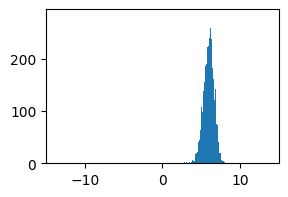

CD123(Eu151Di)_cell_sum


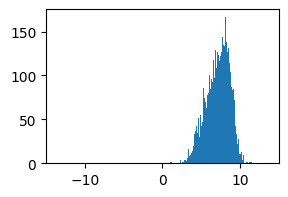

IFNg(Sm152Di)_cell_sum


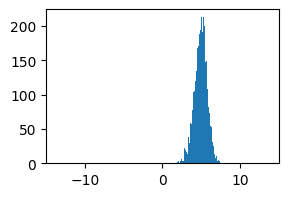

CD11c(Sm154Di)_cell_sum


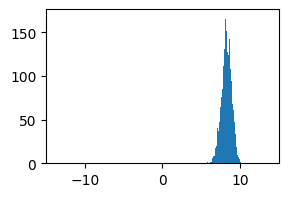

FoxP3(Gd155Di)_cell_sum


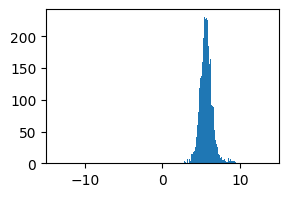

CD4(Gd156Di)_cell_sum


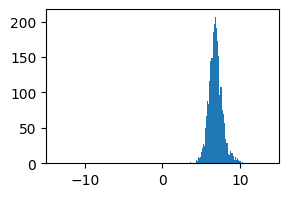

157Gd(Gd157Di)_cell_sum


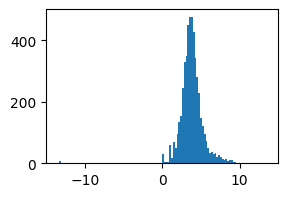

158Gd(Gd158Di)_cell_sum


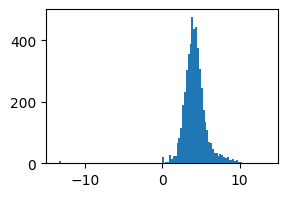

CD68(Tb159Di)_cell_sum


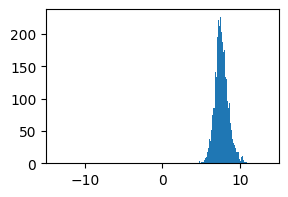

160Dy(Dy160Di)_cell_sum


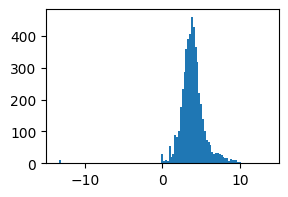

CD8(Dy162Di)_cell_sum


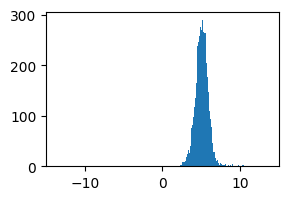

PD-1(Ho165Di)_cell_sum


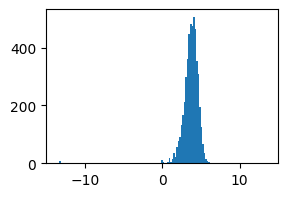

GranzymeB(Er167Di)_cell_sum


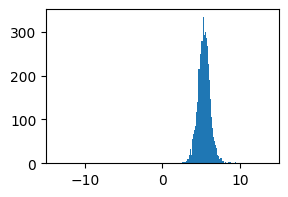

Ki-67(Er168Di)_cell_sum


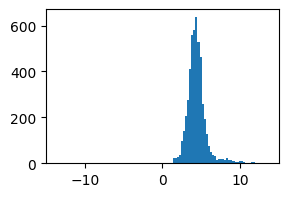

HLA-DR(Yb174Di)_cell_sum


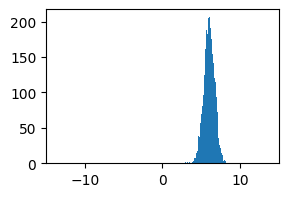

175Lu(Lu175Di)_cell_sum


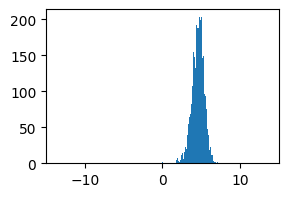

Histone3(Yb176Di)_cell_sum


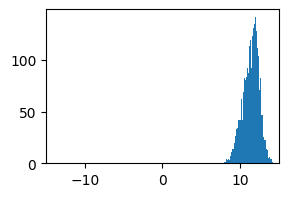

191Ir(Ir191Di)_cell_sum


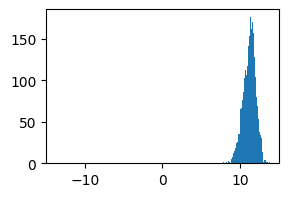

193Ir(Ir193Di)_cell_sum


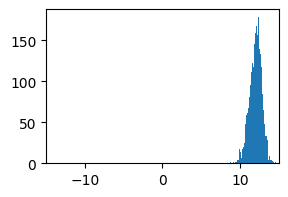

Cisplatin(Pt195Di)_cell_sum


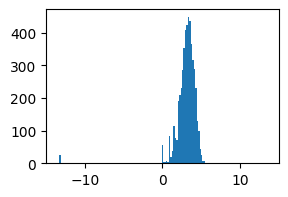

In [33]:
check_feature_distribution(feature_summary_df=cytof_img.df_feature, features=cytof_img.features['cell_sum'])

### Feture log transform and percentile normalization
With feature extraction completed, the feature can then be normalized to make it easire for upcoming analyses. 
`feature_quantile_normalization`

q-th percenrile normalization with q: 75, 99


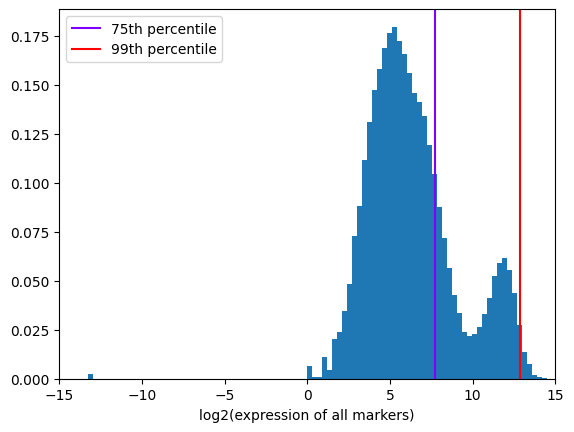

dict quantiles: {75: 210.43274999999997, 99: 7456.578559999987}


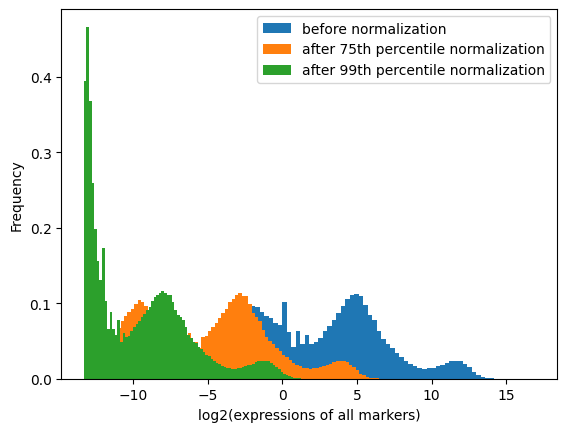

In [34]:
'''
(1) Calculate q-th percentile [75th and 99th] (default) for all single cell & single nuclei data (cell sum & nuclei sum of all markers)
(2) Use q-th percnetile to normalize each feature
(3) Attach normalized feature as new attributes to cytof_img
'''
print(f"q-th percenrile normalization with q: {', '.join(map(str, params.normalize_qs))}")
cytof_img.feature_quantile_normalization(qs=params.normalize_qs)

## Output

#### 1) Save single ROI parameters (can be used for cohort analyses)

In [35]:
# # save single ROI parameters
# params_save = vars(params)

# # (optional) remove those won't be used to process the cohort
# # params_save.pop('filename')
# # params_save.pop('outdir')
# params_save.pop('slide')
# params_save.pop('roi')

# yaml.dump(vars(params), open(os.path.join(outdir, "params.txt"), "w"))

#### 2) Save `CytofImage` class instance

In [36]:
# savename_cytof_img = os.path.join(outdir, "cytof_img.pkl")
# cytof_img.save_cytof(savename_cytof_img)

## Load from saved

In [37]:
# import pickle as pkl
# outdir = os.path.join(params.outdir, params.slide, params.roi)
# cytof_img = pkl.load(open(os.path.join(outdir, "cytof_img.pkl"), "rb"))

## Single ROI downstream analyses
PhenoGraph clustering makes most sense to be performed on a cohort, other analyses including marker positive analyses was also originally class methods of CytofCohort's.  
To perform these analyses on this single ROI, first create a `CytofCohort` class instance.

In [38]:
from cytof.classes import CytofCohort

In [39]:
cytof_roi_name = f"{cytof_img.roi}-{cytof_img.roi}"
cytof_images = {cytof_roi_name: cytof_img}

cytof_img_cohort = CytofCohort(
    cytof_images=cytof_images, 
    dir_out=params.outdir, 
    cohort_name=f"cohort_{cytof_roi_name}")
cytof_img_cohort.batch_process_feature()

dict quantiles in batch process: {75: 210.43274999999997, 99: 7456.578559999987}


#### 1) Pheno-Graph

In [40]:
key_pheno = cytof_img_cohort.clustering_phenograph()  
print(key_pheno)


The attribute name of the feature: df_feature_75normed_scaled
Finding 50 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.2819380760192871 seconds
Jaccard graph constructed in 2.2775025367736816 seconds
Wrote graph to binary file in 0.10464692115783691 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.613571
After 3 runs, maximum modularity is Q = 0.61748
Louvain completed 23 runs in 3.049368143081665 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 7.329350471496582 seconds

8 communities found. The dictionary key for phenograph: 75normed_scaled_all_feature_50_all_markers.
75normed_scaled_all_feature_50_all_markers


Visualization in 2d - cohort-cohort


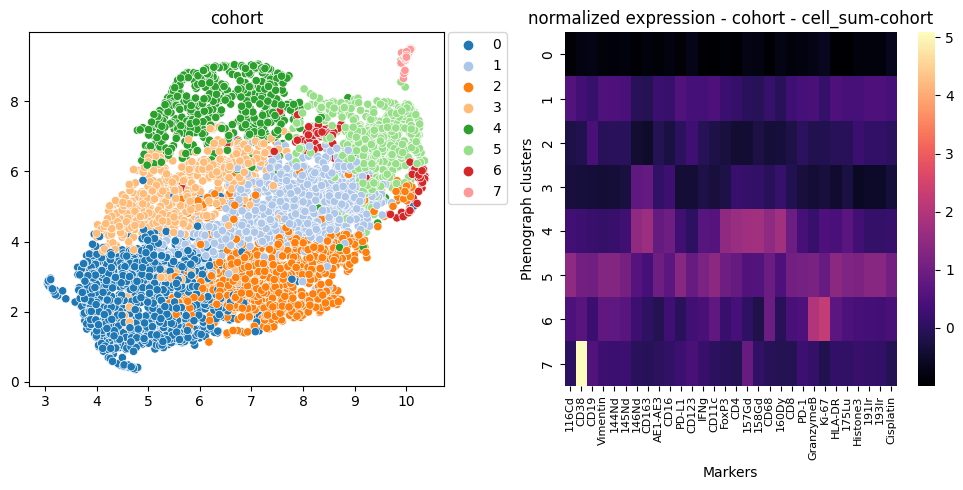

In [41]:
%matplotlib inline
df_feats, commus, cluster_protein_exps, figs, figs_scatter, figs_exps \
        = cytof_img_cohort.vis_phenograph(key_pheno=key_pheno, level="cohort", accumul_type="cell_sum", #["cell_sum", "cell_ave"], 
                                          save_vis=False, plot_together=True, show_plots=True, fig_width=5)


#### 2) Marker Positive

In [42]:
cytof_img_cohort.generate_summary()

Getting thresholds for cell sum of all markers.


['75normed_sum']

In [43]:
vis_marker = "CD19(Nd142Di)" 

stain_nuclei, stain_cell, color_dict = cytof_img.visualize_marker_positive(
            marker=vis_marker,
            feature_type="normed",
            accumul_type="sum",
            normq=75,
            show_boundary=True,
            color_list=[(0,0,1), (0,1,0)], # negative, positive
            color_bound=(0,0,0),
            show_colortable=False)

In [44]:
vis_channel_names = [vis_marker, "nuclei"]
pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_names=vis_channel_names, 
                                visualize=False)

Visualizing channels: CD19(Nd142Di), nuclei
Visualizing... 
CD19(Nd142Di) in red
nuclei in green



Visualizing channels: CD19(Nd142Di), nuclei
Visualizing... 
CD19(Nd142Di) in red
nuclei in green



(-0.5, 299.5, 299.5, -0.5)

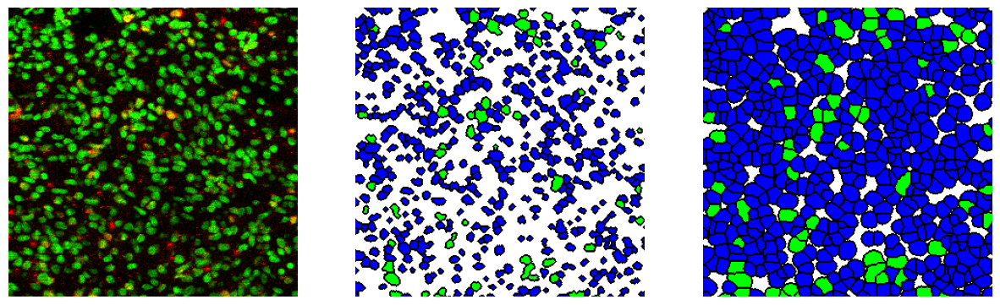

In [45]:
%matplotlib inline

pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_names=vis_channel_names, 
                                    visualize=False)

    # ## adjust brightness of channels
    # # adjust brightness of the red channel
    # pseudoRGB[..., 0] = np.array(np.clip(pseudoRGB[..., 0] / np.quantile(pseudoRGB[..., 0].reshape(-1), 0.95), 
    #                            0, 1) * 255, dtype=np.uint8)
    # # adjust brightness of the green channel
    # pseudoRGB[..., 1] = np.array(np.clip(pseudoRGB[..., 1] * 0.9, 0, 255), dtype=np.uint8)

r, c, _ = pseudoRGB.shape
maxr = min(r, 300)
maxc = min(c, 300)
fig, axs = plt.subplots(1,3,figsize=(15, 5))
axs[0].imshow(pseudoRGB[0:maxr, 0:maxc, :])
axs[0].axis('off')
axs[1].imshow(stain_nuclei[0:maxr, 0:maxc, :])
axs[1].axis('off')
axs[2].imshow(stain_cell[0:maxr, 0:maxc, :])
axs[2].axis('off')

Please reference `tutorial-figures.ipynb` for ROI and cohort level for additional downstream analysis [co-expression and spatial interaction]

In [46]:
!pip freeze

aiofiles==23.2.1
altair==5.1.2
annotated-types==0.6.0
anyio==3.7.1
asttokens @ file:///opt/conda/conda-bld/asttokens_1646925590279/work
attrs==23.1.0
backcall @ file:///home/ktietz/src/ci/backcall_1611930011877/work
certifi==2023.7.22
charset-normalizer==3.3.2
click==8.1.7
colorama==0.4.6
comm @ file:///croot/comm_1671231121260/work
contourpy==1.1.1
cycler==0.12.1
debugpy @ file:///croot/debugpy_1690905042057/work
decorator @ file:///opt/conda/conda-bld/decorator_1643638310831/work
exceptiongroup==1.1.3
executing @ file:///opt/conda/conda-bld/executing_1646925071911/work
fastapi==0.104.1
ffmpy==0.3.1
filelock==3.13.1
Flask==2.2.3
fonttools==4.43.1
fsspec==2023.10.0
gradio==4.0.2
gradio_client==0.7.0
h11==0.14.0
httpcore==0.18.0
httpx==0.25.0
huggingface-hub==0.18.0
idna==3.4
igraph==0.10.8
imagecodecs @ file:///croot/imagecodecs_1695064943445/work
imageio==2.31.6
importlib-metadata @ file:///croot/importlib-metadata_1678997070253/work
importlib-resources==6.1.0
ipykernel @ file:///croo